In [1]:
#Importing the library

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import plotly.graph_objs as go
import json
import plotly.offline as py
import seaborn as sns
plt.style.use('fivethirtyeight')

# 3. Downloading the Dataset

This dataset is updated on daily basis by Johns Hopkins CSSE.

In [2]:
# Global Data
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')



## Have a look at the general data:

In [3]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,54278,54403,54483,54559,54595,54672,54750,54854,54891,54939
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,69238,69916,70655,71441,72274,72812,73691,74567,75454,76350
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,104606,104852,105124,105369,105596,105854,106097,106359,106610,106887
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,9308,9379,9416,9499,9549,9596,9638,9716,9779,9837
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,19093,19177,19269,19367,19399,19476,19553,19580,19672,19723


In [4]:
deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,2354,2363,2370,2373,2378,2385,2389,2389,2397,2399
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,1291,1296,1303,1310,1315,1324,1332,1339,1350,1358
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,2849,2853,2856,2861,2863,2866,2871,2877,2881,2884
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,92,93,93,96,96,97,97,98,100,100
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,444,448,452,457,459,461,462,462,464,464


In [10]:
recoveries_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,46554,46759,46887,46912,46943,47298,47365,47459,47549,47583
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,41464,41969,42426,42895,43384,43890,44291,44880,45383,45906
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,70933,71127,71343,71552,71755,71945,72143,72336,72538,72745
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,8349,8399,8474,8537,8588,8652,8724,8774,8851,8942
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,16822,16921,17176,17223,17249,17266,17327,17388,17602,17692


#  4. Global Analysis

## Problem 1

    Calculate the number of total cases, total deaths, total recovered, and total active by time (day units).

In [3]:
cols = confirmed_df.keys()
confirmed = confirmed_df.loc[:, cols[4]:cols[-2]]
deaths = deaths_df.loc[:, cols[4]:cols[-2]]
recoveries = recoveries_df.loc[:, cols[4]:cols[-2]]
dates = confirmed.keys()

total_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 
adjusted_dates = list(np.array([i for i in range(len(dates))]).reshape(-1, 1)[:, 0])

#Insert your code here:
total=confirmed.sum()
for i  in total:
    total_cases.append(i)
die=deaths.sum()
for i in die :
    total_deaths.append(i)
recov=recoveries.sum()
for i in recov :
    total_recovered.append(i)
active=total-die-recov
for i in active :
    total_active.append(i)



In [48]:
#  The number of total cases, total deaths, total recovered, and total active until now.
print("Total confirmed cases: ", total_cases[-1])
print("Total death cases: ", total_deaths[-1])
print("Total recoveries cases: ", total_recovered[-1])
print("Total active cases: ", total_active[-1])


Total confirmed cases:  103869838
Total death cases:  2253064
Total recoveries cases:  57671339
Total active cases:  43945435
378


## Problem 2

    Visualize the number and the log(10) of total cases, total deaths, total recovered, and total active by time (day units) in 2 graph (one for the number and the other for the log(10)) using line chart.

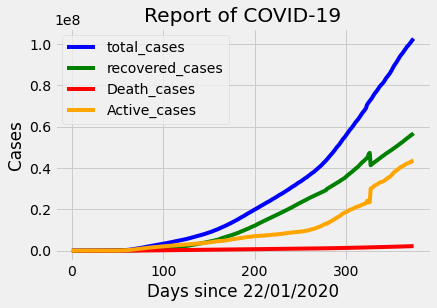

In [6]:
#Insert your code here:
plt.plot(adjusted_dates,total_cases,color='blue',label='total_cases')
plt.plot(adjusted_dates,total_recovered,color='green',label='recovered_cases')
plt.plot(adjusted_dates,total_deaths,color='red',label='Death_cases')
plt.plot(adjusted_dates,total_active,color='orange',label='Active_cases')
plt.rcParams["figure.figsize"] = (12,7)
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of COVID-19')
plt.legend()
plt.show()


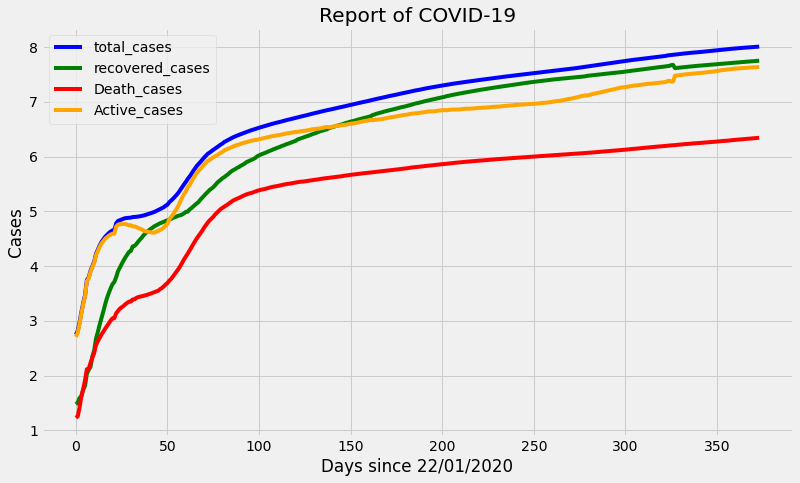

In [29]:
plt.plot(adjusted_dates,np.log10(total_cases),color='blue',label='total_cases')
plt.plot(adjusted_dates,np.log10(total_recovered),color='green',label='recovered_cases')
plt.plot(adjusted_dates,np.log10(total_deaths),color='red',label='Death_cases')
plt.plot(adjusted_dates,np.log10(total_active),color='orange',label='Active_cases')
plt.rcParams["figure.figsize"] = (12,7)
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of COVID-19')
plt.legend()
plt.show()


## Problem 3
    Visualize the number of total cases, total deaths, total recovered, and total active by time (day units) in 4 separated graphs using line chart.

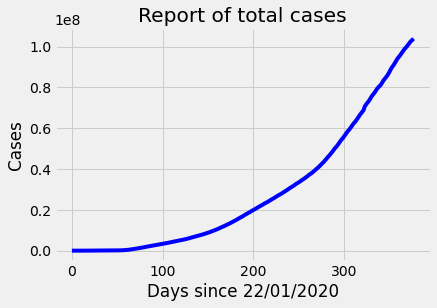

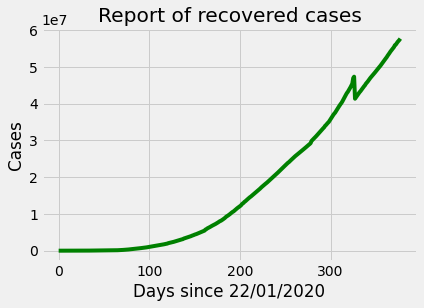

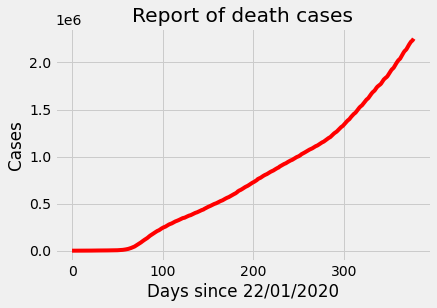

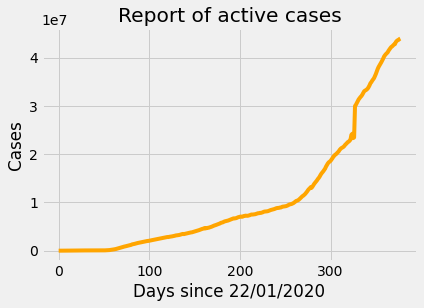

In [46]:
#Insert your code here:
plt.plot(adjusted_dates,(total_cases),color='blue',label='total_cases')
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of total cases')
plt.show()
plt.plot(adjusted_dates,(total_recovered),color='green',label='recovered_cases')
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of recovered cases')
plt.show()
plt.plot(adjusted_dates,(total_deaths),color='red',label='Death_cases')
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of death cases')
plt.show()
plt.plot(adjusted_dates,(total_active),color='orange',label='Active_cases')
plt.xlabel('Days since 22/01/2020')
plt.ylabel('Cases')
plt.title('Report of active cases')
plt.show()

## Problem 4
    Calculate the number of daily increases in total cases, total deaths, total recovered, and total active by time (day units).

In [27]:
#Insert your code here:
world_daily_increase=[]
world_daily_death=[]
world_daily_recovery=[]
world_daily_active=[]
world_daily_increase.append(total_cases[0])
world_daily_death.append(total_deaths[0])
world_daily_recovery.append(total_recovered[0])
world_daily_active.append(total_active[0])
for i in range(len(total_cases)-1):
    world_daily_increase.append(total_cases[i+1]-total_cases[i])
    world_daily_death.append(total_deaths[i+1]-total_deaths[i])
    world_daily_recovery.append(total_recovered[i+1]-total_recovered[i])
    world_daily_active.append(total_active[i+1]-total_active[i])
   

## Problem 5
    Visualize the number of daily increases in total cases, total deaths, total recovered, and total active by time (day units) in 4 separate graphs using the bar chart.

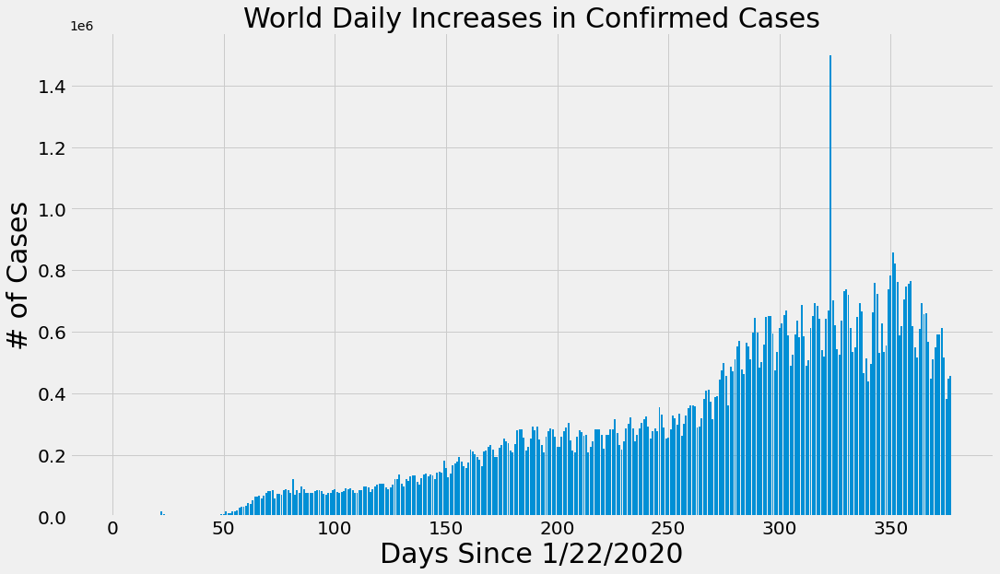

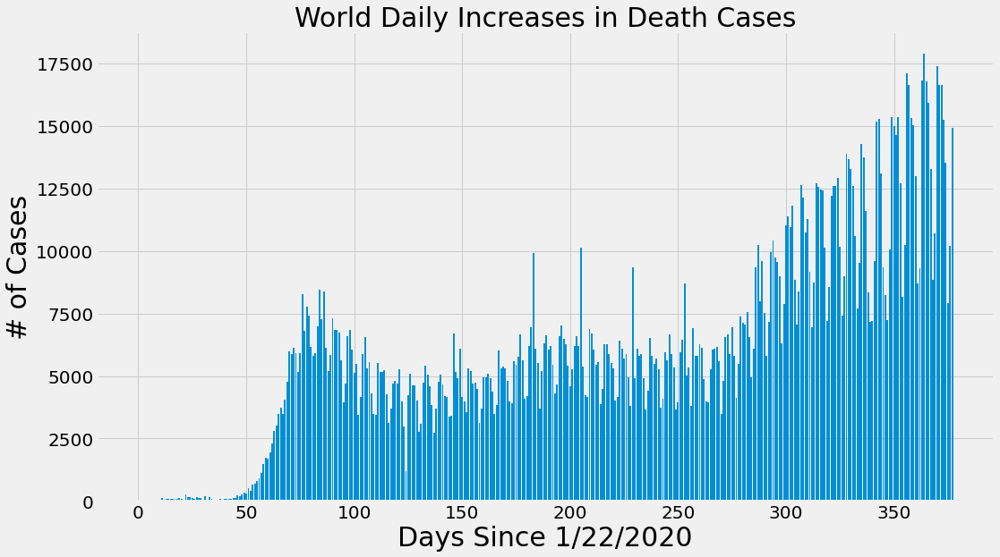

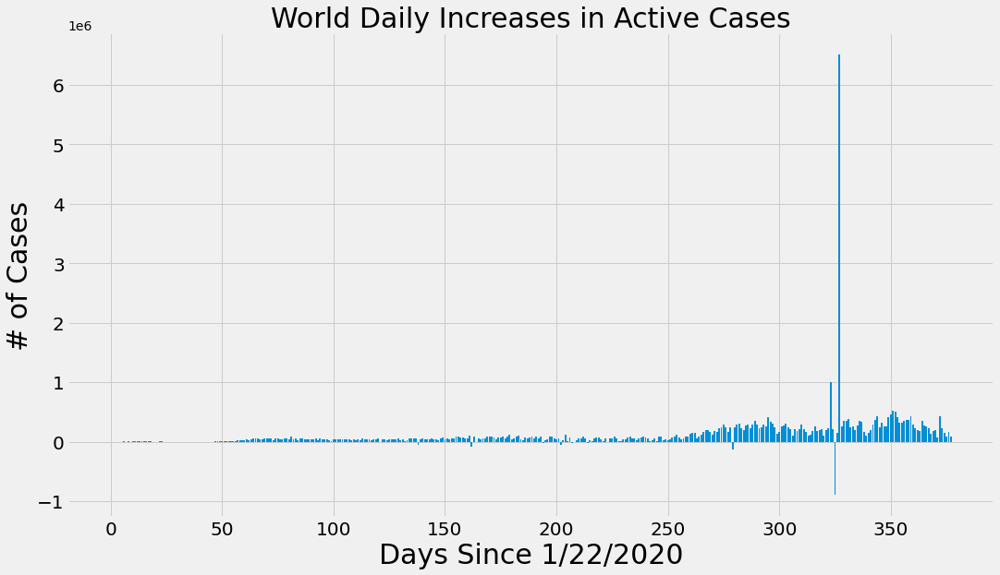

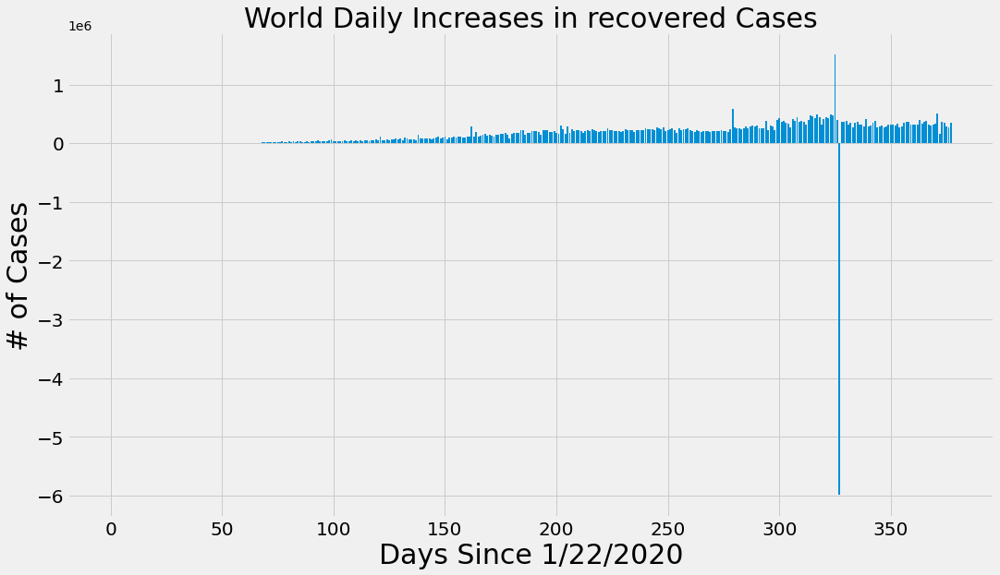

In [30]:
#Insert your code here:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, (world_daily_increase))
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, (world_daily_death))
plt.title('World Daily Increases in Death Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, (world_daily_active))
plt.title('World Daily Increases in Active Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, (world_daily_recovery))
plt.title('World Daily Increases in recovered Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# Problem 6:
    Calculate the global mortality and recovered rate in percentage by time.

In [12]:
#Insert your code here:
mortality_rate=[]
recovery_rate=[]
for total,death in zip(total_cases,total_deaths):
    mortality_rate.append(death*100/total)
for total,recov in zip(total_cases,total_recovered):
    recovery_rate.append(recov*100/total)


# Problem 7
**7.1** 

    Visualize the mortality rate in by time (day units) using the line chart.

    Using the dashline to visualize the average mortality rate of all the time.

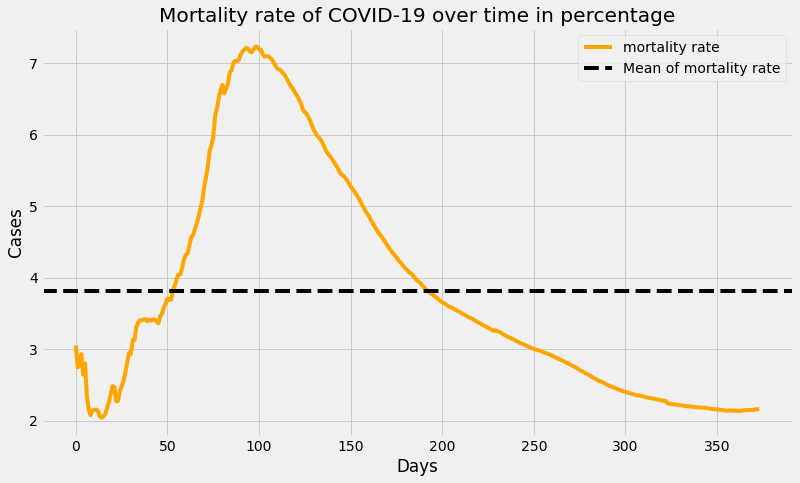

In [25]:
#Insert your code here:
plt.plot(adjusted_dates,mortality_rate,color='Orange',label='mortality rate')
plt.title('Mortality rate of COVID-19 over time in percentage')
plt.axhline(y=np.mean(mortality_rate),color='black',linestyle='dashed',label='Mean of mortality rate')
plt.xlabel('Days')
plt.ylabel('Cases')
plt.legend()
plt.show()
# how to label the dashline to the legend ???

**7.2** 

    Visualize the mortality rate in by time (day units) using the line chart.

    Using the dashline to visualize the average mortality rate of all the time.

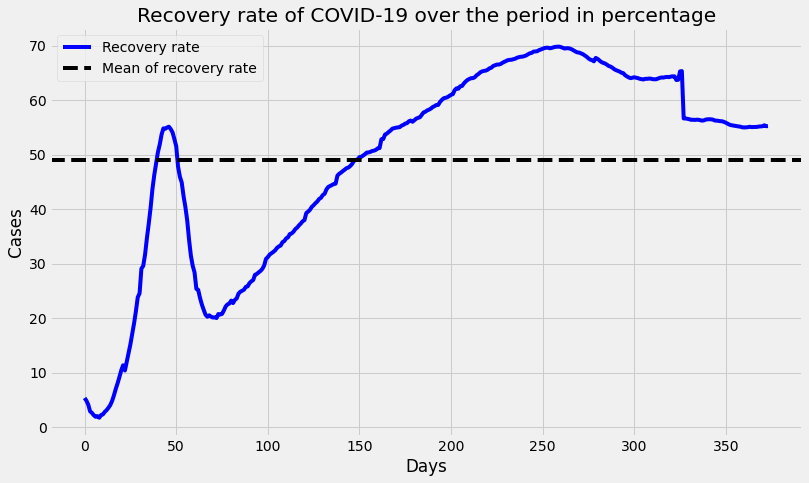

In [24]:
#Insert your code here:
plt.plot(adjusted_dates,recovery_rate,color='blue',label='Recovery rate')
plt.axhline(y=np.mean(recovery_rate),color='black',linestyle='dashed',label='Mean of recovery rate')
plt.title('Recovery rate of COVID-19 over the period in percentage')
plt.xlabel('Days')
plt.ylabel('Cases')
plt.legend()
plt.show()

#  5. Continent Analysis

## Data Prerocessing

In [4]:
# Changing the conuntry names as required by pycountry_convert Lib
confirmed_df.loc[confirmed_df['Country/Region'] == "US", "Country/Region"] = "USA"
deaths_df.loc[deaths_df['Country/Region'] == "US", "Country/Region"] = "USA"
recoveries_df.loc[recoveries_df['Country/Region'] == "US", "Country/Region"] = "USA"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Korea, South', "Country/Region"] = 'South Korea'
deaths_df.loc[deaths_df['Country/Region'] == 'Korea, South', "Country/Region"] = 'South Korea'
recoveries_df.loc[recoveries_df['Country/Region'] == "Korea, South", "Country/Region"] = "South Korea"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Taiwan*', "Country/Region"] = 'Taiwan'
deaths_df.loc[deaths_df['Country/Region'] == 'Taiwan*', "Country/Region"] = 'Taiwan'
recoveries_df.loc[recoveries_df['Country/Region'] == "Taiwan*", "Country/Region"] = "Taiwan"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Congo (Kinshasa)', "Country/Region"] = 'Democratic Republic of the Congo'
deaths_df.loc[deaths_df['Country/Region'] == 'Congo (Kinshasa)', "Country/Region"] = 'Democratic Republic of the Congo'
recoveries_df.loc[recoveries_df['Country/Region'] == "Congo (Kinshasa)", "Country/Region"] = "Democratic Republic of the Congo"

confirmed_df.loc[confirmed_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"
deaths_df.loc[deaths_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"
recoveries_df.loc[recoveries_df['Country/Region'] == "Cote d'Ivoire", "Country/Region"] = "Côte d'Ivoire"

confirmed_df.loc[confirmed_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"
deaths_df.loc[deaths_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"
recoveries_df.loc[recoveries_df['Country/Region'] == "Reunion", "Country/Region"] = "Réunion"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Congo (Brazzaville)', "Country/Region"] = 'Republic of the Congo'
deaths_df.loc[deaths_df['Country/Region'] == 'Congo (Brazzaville)', "Country/Region"] = 'Republic of the Congo'
recoveries_df.loc[recoveries_df['Country/Region'] == "Congo (Brazzaville)", "Country/Region"] = "Republic of the Congo"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Bahamas, The', "Country/Region"] = 'Bahamas'
deaths_df.loc[deaths_df['Country/Region'] == 'Bahamas, The', "Country/Region"] = 'Bahamas'
recoveries_df.loc[recoveries_df['Country/Region'] == "Bahamas, The", "Country/Region"] = "Bahamas"

confirmed_df.loc[confirmed_df['Country/Region'] == 'Gambia, The', "Country/Region"] = 'Gambia'
deaths_df.loc[deaths_df['Country/Region'] == 'Gambia, The', "Country/Region"] = 'Gambia'
recoveries_df.loc[recoveries_df['Country/Region'] == "Gambia, The", "Country/Region"] = "Gambia"

# getting all countries
countries = np.asarray(confirmed_df["Country/Region"])
countries1 = np.asarray(deaths_df["Country/Region"])
countries2 = np.asarray(recoveries_df["Country/Region"])

# Continent_code to Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'


# Problem 8
    Add the field "continent" into the confirm_df, deaths_df and recorveries_df dataset:

In [5]:

 confirmed_df.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
 deaths_df.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
 recoveries_df.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries2[:]])
    

# Problem 9
    Create the countries_df data frame with the index as the "Country/Region" field.
    These column infor will be: 
    - continent: Country continent.
    - Deaths: Total number of confirmed.
    - Deaths: Total number of deaths.
    - Recoveries: Total number of recoveries.
    - Active: Total number of active.
    - Mortality Rate: Mortality rate in percentage.

In [6]:
#Insert your code here:
countries_df=confirmed_df.groupby('Country/Region').mean()[['Lat','Long']]
countries_df.insert(2,'continent',[continents[country_to_continent_code(country)] for country in countries_df.index])
countries_df['Total']=confirmed_df.groupby('Country/Region').sum().iloc[:,-1]
countries_df['Deaths']=deaths_df.groupby('Country/Region').sum().iloc[:,-1]
countries_df['Recoveries']=recoveries_df.groupby('Country/Region').sum().iloc[:,-1]
countries_df['Active']=countries_df['Total']-countries_df['Deaths']-countries_df['Recoveries']
countries_df['Mortality_rate']=np.round(countries_df['Deaths']*100/countries_df['Total'],2)
countries_df.head()

,Lat,Long,continent,Total,Deaths,Recoveries,Active,Mortality_rate
Country/Region,,,,,,,,
Afghanistan,33.93911,67.709953,Asia,55174,2406,47982,4786,4.36
Albania,41.15330,20.168300,Europe,80941,1404,48958,30579,1.73
Algeria,28.03390,1.659600,Africa,108116,2900,73940,31276,2.68
Andorra,42.50630,1.521800,Europe,10070,103,9313,654,1.02
Angola,-11.20270,17.873900,Africa,19937,470,18335,1132,2.36


# Problem 10
    Create the continents_df data frame with the index as the "continent" field.
    These column infor will be: 
    - Confirmed: Country continent.
    - Deaths: Total number of deaths.
    - Recoveries: Total number of recoveries.
    - Active: Total number of active.
    - Mortality Rate: Mortality rate in percentage.

In [7]:
continents_df=countries_df.copy().drop(['Lat','Long'],axis=1).groupby('continent').sum()
continents_df['Mortality_rate']=np.round(continents_df['Deaths']*100/continents_df['Total'],2)
continents_df['Recoveries_rate']=np.round(continents_df['Recoveries']*100/continents_df['Total'],2)
continents_df.head()

,Total,Deaths,Recoveries,Active,Mortality_rate,Recoveries_rate
continent,,,,,,
Africa,3612611,93073,3113686,405852,2.58,86.19
Asia,23054618,371536,21529303,1153779,1.61,93.38
Australia,32099,945,29206,1948,2.94,90.99
Europe,30780997,719494,15422416,14639087,2.34,50.10
North America,30437645,655824,3110084,26671737,2.15,10.22


## Sample line ploting
Here are the sample functions for visualizing covid cases by time in each continent/country:

In [8]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths,
                          continent=None , country = None , state = None, period = None, figure = None,
                          scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["blue","red","green"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else:
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stats[0][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stats[1][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+confirmed_df.columns[5]+" - "+confirmed_df.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        


    # Problem 11
**11.1** 

    Apply the visualize_covid_cases function to show up the Covid visualization of 7 continents in the 7 separated line charts. The order of visualization is sorted in descending order by the number of confirmed. 
    

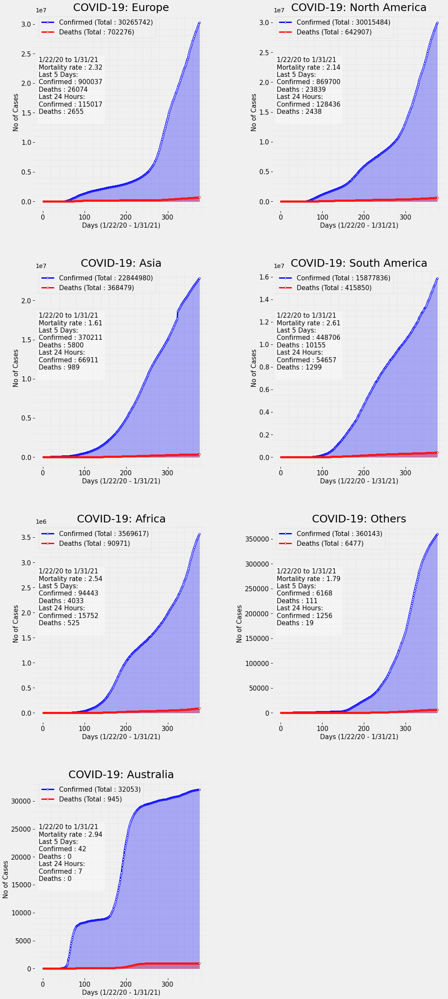

In [20]:
# Insert your code here:
continents = continents_df.sort_values(continents_df.columns[0],ascending = False).index
cols =2
rows = int(np.ceil(len(continents)/cols))
f = plt.figure(figsize=(18,9*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(confirmed_df, deaths_df, continent = continent,figure = [f,rows,cols, i+1])
plt.show()


**11.2**

    Modify the "plot_params" and "visualize_covid_cases" function to: 
    - Show up the results of the last 7 days instead of 5 days.
    - Add the "Recoveries line" to the main chart.
    - Add the "Total Recoveries" number to the small table.
    - Add the "Recoveries" filed in the last 7 days and 24 hours to the information menu.

In [31]:
#Insert your code here:
def new_visualize_covid_cases(confirmed, deaths,recoveries,
                          continent=None , country = None , state = None, period = None, figure = None,
                          scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths,recoveries]
    label = ["Confirmed", "Deaths","Recoveries"]
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["blue","red","green"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else:
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
        Total_recoveries=np.sum(np.asarray(stats[2].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stats[0][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stats[1][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_recoveries = np.sum(np.asarray(stats[2][stats[2][params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
    text = stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 7 Days:\n"
    text += "Confirmed: " + str(Total_confirmed[-1] - Total_confirmed[-8])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-8])+"\n"
    text += 'Recoveries :' + str(Total_recoveries[-1]-Total_recoveries[-8]) +'\n'
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    text += 'Recoveries :' + str(Total_recoveries[-1]-Total_recoveries[-2]) +'\n'
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+confirmed_df.columns[5]+" - "+confirmed_df.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
   

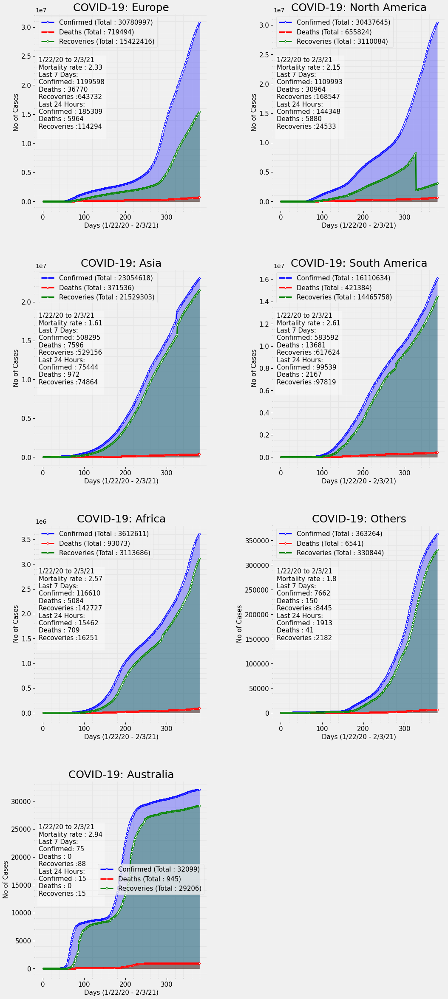

In [32]:
continents = continents_df.sort_values(continents_df.columns[0],ascending = False).index
cols =2
rows = int(np.ceil(len(continents)/cols))
f = plt.figure(figsize=(18,9*rows))
for i,continent in enumerate(continents):
    new_visualize_covid_cases(confirmed_df, deaths_df,recoveries_df, continent = continent,figure = [f,rows,cols, i+1])
plt.show()

# Problem 12
    Visualize the covariance matrix for continents_df.

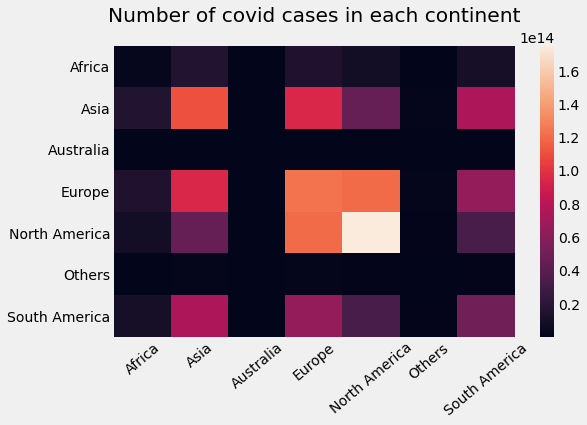

In [50]:
#Insert your code here:
matrix=np.cov(continents_df,bias=True)
label=continents_df.index.values
sns.heatmap(matrix,fmt='g',yticklabels=label,xticklabels=label)
plt.rcParams["figure.figsize"] = (8,5)
plt.xticks(rotation=40)
plt.title('Number of covid cases in each continent',y=1.06)
plt.show()

# Problem 13
    Build the pie chart to compare proportions of the number of confirmed, deaths, recoveries, and active of the 7 continents.
    Each field (confirm, deaths, ...) should be presented in different pie charts.
    You are not allowed to use repeated code snippet here, let try to use a for loop.
    Each continent should be presented in different colors.

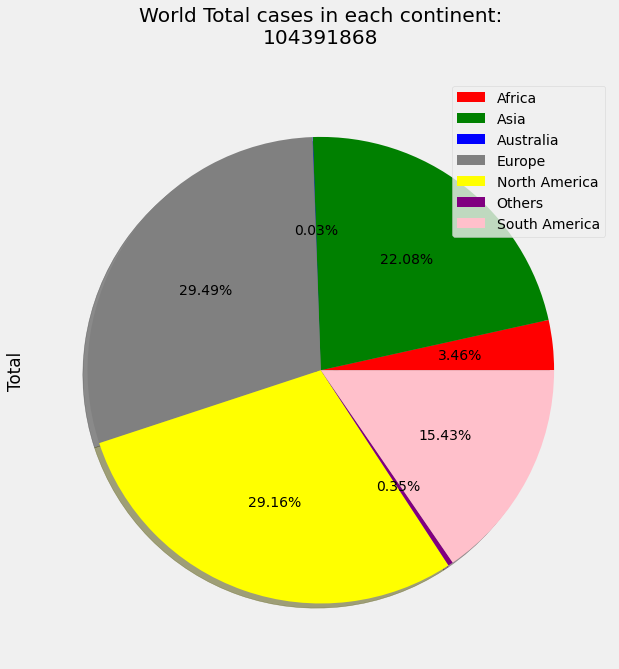

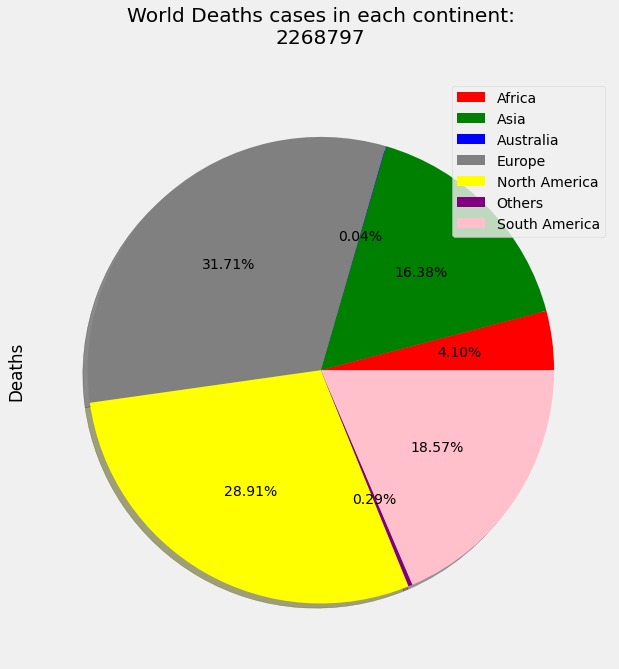

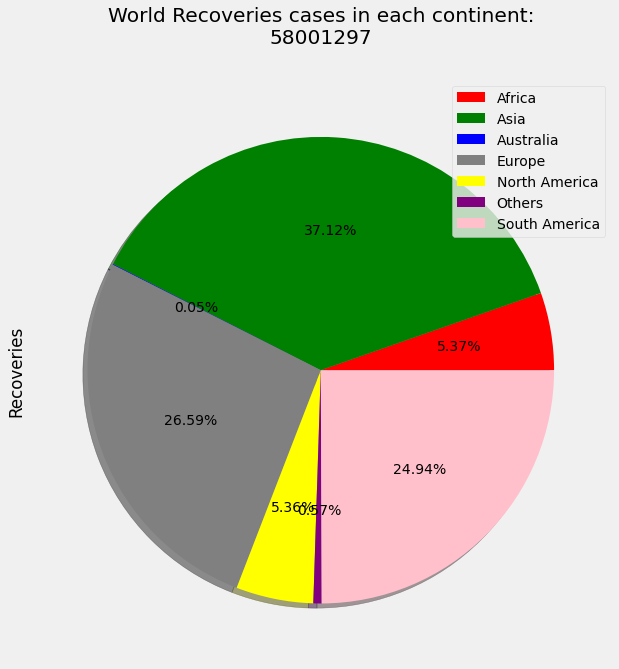

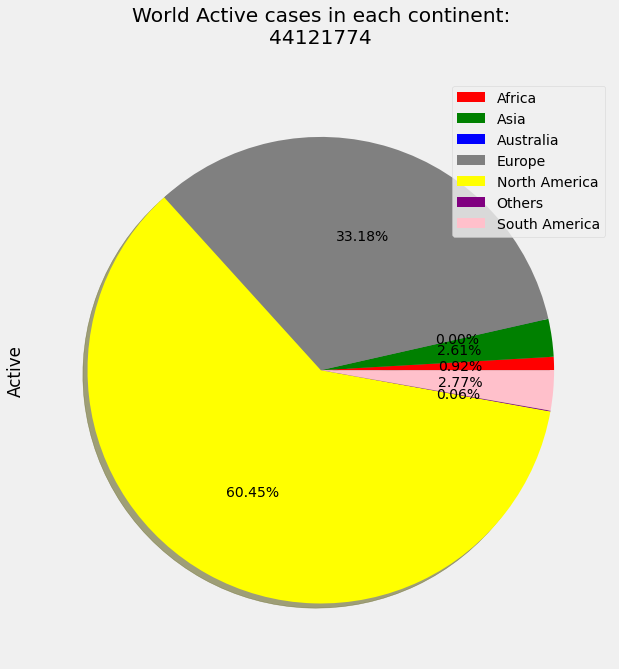

In [36]:
#Insert your code here:
field=['Total','Deaths','Recoveries','Active']
for col in field :
    Tot=continents_df['{}'.format(col)].sum()
    continents_df[col].plot(kind='pie',figsize=(20,10),
                                autopct='%1.2f%%',labels=None,
                                colors=['red','green','blue','grey','yellow','purple','pink'],
                                shadow=True)

    plt.legend(continents_df.index,loc='upper right')
    plt.title('World {} cases in each continent:'.format(col)+'\n'+str(Tot),y=1.05)
    plt.show()

# 6. Country analysis

# Problem 14
    Build a folium map to show up the number of confirmed, deaths, recovered and mortality rate of each country based on countries' location. The radius of the cicle is proportional to the number of confirmed.
![title](problem14.png)

In [15]:
countries_df.rename(columns={'Total':'Confirmed'},inplace=True)

In [19]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
index_list = list(countries_df.index)
for i in range(0,len(countries_df)):
    folium.Circle(
    location=[countries_df.iloc[i]['Lat'], countries_df.iloc[i]['Long']],
    tooltip = "<h5 style='text-align:center;font-weight: bold'>"+index_list[i]+"</h5>"+
    "<hr style='margin:10px;'>"+
    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;            padding-right:20px'>"+
    "<li>Confirmed: "+str(countries_df.iloc[i]['Confirmed'])+"</li>"+
    "<li>Deaths: "+str(countries_df.iloc[i]['Deaths'])+"</li>" +
    "<li>Recovered: "+str(countries_df.iloc[i]['Recoveries'])+"</li>" +
    "<li>Mortality Rate: "+str(np.round(countries_df.iloc[i]['Deaths']/(countries_df.iloc[i]     ['Confirmed']+1.00001)*100,2))+"</li>"+
    "</ul>"
    ,
    radius=(int((np.log(countries_df.iloc[i]['Confirmed']+1.00001)))+0.2)*50000,
    color='#ff6600',
    fill_color='#ff8533',
    fill=True).add_to(world_map) 


# Problem 15
Build a px [(plotly.express)](https://plotly.com/python/plotly-express/) map to show up the number of active of each country in log(10) based on countries' name using the "spectral" color.

In [16]:
nation=countries_df.copy().reset_index()
nation['Active']=np.log10(nation['Active'])
nation.head()


,Country/Region,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,Mortality_rate
0,Afghanistan,33.93911,67.709953,Asia,55174,2406,47982,3.679973,4.36
1,Albania,41.15330,20.168300,Europe,80941,1404,48958,4.485423,1.73
2,Algeria,28.03390,1.659600,Africa,108116,2900,73940,4.495211,2.68
3,Andorra,42.50630,1.521800,Europe,10070,103,9313,2.815578,1.02
4,Angola,-11.20270,17.873900,Africa,19937,470,18335,3.053846,2.36


In [130]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth(nation, geojson=counties,locations="Country/Region",
                    color="Active", # lifeExp is a column of gapminder
                    hover_name="Country/Region", # column to add to hover information
                    color_continuous_scale="spectral",
                    range_color=(0, 12))
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [26]:
#Insert your code here:



/home/hana/hana/env37/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning:

divide by zero encountered in log10



# Problem 16
    Filter the top 10 countries baseđ on the number of confirmed cases.

In [18]:
#Insert your code here:
df_top10=countries_df.sort_values(by='Confirmed',ascending=False).head(10)
df_top10.head()

,Lat,Long,continent,Confirmed,Deaths,Recoveries,Active,Mortality_rate
Country/Region,,,,,,,,
USA,40.000000,-100.000000,North America,26557026,450797,0,26106229,1.70
India,20.593684,78.962880,Asia,10790183,154703,10480455,155025,1.43
Brazil,-14.235000,-51.925300,South America,9339420,227563,8311881,799976,2.44
United Kingdom,24.548173,-43.902242,Europe,3882972,109547,9936,3763489,2.82
Russia,61.524010,105.318756,Europe,3858367,73497,3328696,456174,1.90


# Problem 17
    Visualize the top 10 confirmed countries with number active, recoveries and deaths cases using the stacked bar chart.
![title](problem17.png)

In [493]:
from matplotlib.ticker import ScalarFormatter,FormatStrFormatter,FuncFormatter

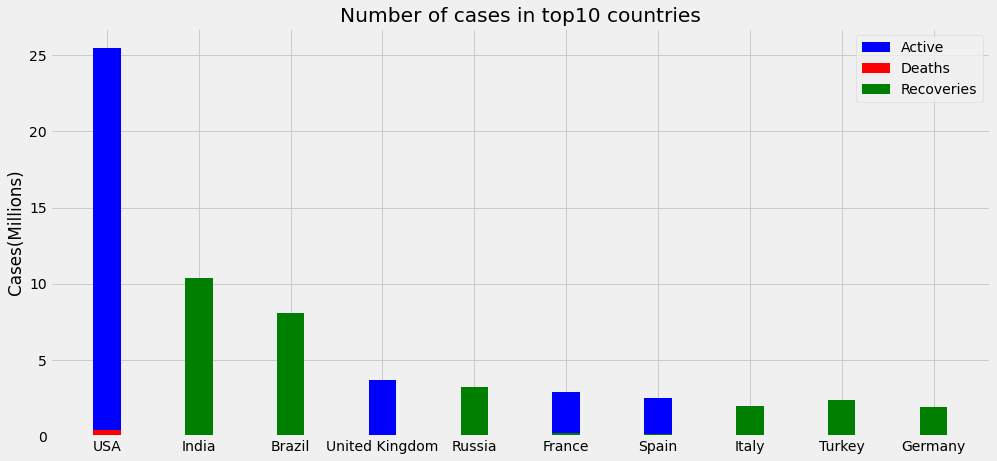

In [517]:

plt.bar(df_top10.index.values,'Active',width=0.3,data=df_top10,color='blue')
plt.bar(df_top10.index.values,'Deaths',width=0.3,data=df_top10,color='red')
plt.bar(df_top10.index.values,'Recoveries',width=0.3,data=df_top10,color='green')
plt.ylabel('Cases(Millions)')
plt.title('Number of cases in top10 countries')
plt.legend(['Active','Deaths','Recoveries'])
ax=plt.gca()
ax.get_yaxis().set_major_formatter(
FuncFormatter(lambda x, p: format(int(x/1000000), ',')))


# 7. Advanced Analysis
 

# Problem 18
    Based on the data visualization on global part, does the COVID 2019 epidemic in the world has reached its peak?
    Put your answer here:

As we can see,all of the graphs in term of COVID cases are likely to rise rapidly day by day.Thus,it is plausible to condemn that this pandemic has not reached its peak despite the lower rate of mortality

# Problem 19:
Based on the data visualization on the continent part:

    19.1 Which continent has the highest death rate over continents' active cases?

    19.2 Which continent has the highest rate on COVID 2019 spread rate over continents' active cases?
    
    19.3 Which continent has the highest recoveries rate over continents' dataset?

(Note: COVID 2019 Spread rate = Number of new confirmed in the last 10 days / number of active before).
Put your answer here:


- Australia has the highest mortailty rate in 7 different continents,which is 2.95%
- Australia simultaneouly got the highest_spread_rate at 2.43 % (use visualize_covid_case())
- Asia accounts for the highest recoveries rate at 93.18%

# Problem 20
Based on the data visualization on the country part:

    20.1 Which country has the highest death rate over countries' dataset?

    20.2 Which country has the highest rate on COVID 2019 spread rate over countries'dataset?
    
    20.3 Which country has the highest recoveries rate over countries' dataset?
Put your answer here:
- Yemen has the highest death rate at 29.01%

-

- There are 4 countries Which are Vanuatu,Micronesia,Samoa and Marshall Islands simultaneously owned the highest spread rate at 100%


# Problem 21
**USA dataset**

In [9]:
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/07-06-2020.csv')

Based on the USA data:

    21.1 Which state has the highest death rate over states' dataset?

    21.2 Which state has the highest rate on COVID 2019 spread rate over states' dataset?
    
    21.3 Which state has the highest recoveries rate over states' dataset?

    - Connecticut has the highest mortality rate at 9.2 %
    
    - Diamond princess got the highest spread rate at 100%

    - Minnesota has the highest recovered rate at 88% 

In [10]:
#Insert your code here:
us_medical_data.insert(9,'Deaths_rate',us_medical_data['Deaths']/us_medical_data['Confirmed'])
us_medical_data.sort_values(by='Deaths_rate',ascending=False).head()


,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Deaths_rate,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
7,Connecticut,US,2020-07-07 04:34:13,41.5978,-72.7554,46976,4338,8210.0,34428.0,0.092345,9,1317.593787,524364.0,10411.0,9.234503,84000009,USA,14707.483577,22.162381
34,New Jersey,US,2020-07-07 04:34:13,40.2989,-74.5210,174766,15229,30729.0,127653.0,0.087139,34,1954.596783,1549209.0,20237.0,8.771910,84000034,USA,17441.745786,11.656519
26,Michigan,US,2020-07-07 04:34:13,43.3266,-84.5361,73267,6221,52841.0,14205.0,0.084909,26,733.634215,1159363.0,NaN,8.490862,84000026,USA,11608.887561,NaN
36,New York,US,2020-07-07 04:34:13,42.1657,-74.9481,397649,32219,71040.0,294390.0,0.081024,36,2044.093624,4288131.0,89995.0,8.102372,84000036,USA,22042.910293,22.631768
25,Massachusetts,US,2020-07-07 04:34:13,42.2302,-71.5301,110137,8198,93157.0,8782.0,0.074435,25,1597.924586,899417.0,11469.0,7.443457,84000025,USA,13049.207233,10.413394


In [63]:
# us_medical_data.insert(7,'recovered_rate',us_medical_data['Recovered']/us_medical_data['Confirmed'])
us_medical_data.shape

(58, 18)